# **Data Visualization**
> Satellite Image Segmentation and KPI's

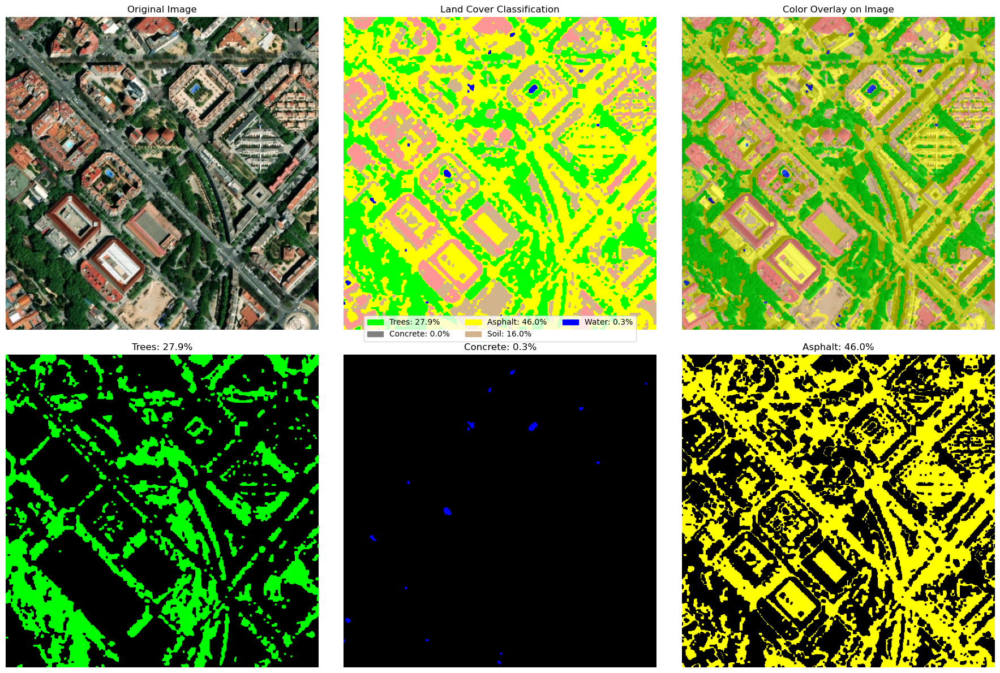


Land Cover Classification Results:
Trees: 27.85%
Brick: 14.96%
Water: 0.27%
Concrete: 0.00%
Soil: 16.03%
Asphalt: 46.04%

Total coverage: 105.16%


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Get the uploaded filename
image_path = "OSM_satellite_images/5.png"

# Load the image
image = cv2.imread(image_path)

# Resize the image to 500x500
image = cv2.resize(image, (500, 500))

# Convert BGR to RGB for correct display
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert BGR to HSV for color detection
image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define HSV ranges for different colors with your preferred labels
color_ranges = {
    "Trees": ([35, 50, 30], [85, 255, 200]),       # Green vegetation
    "Brick": ([0, 30, 50], [15, 255, 255]),        # Light to dark reds
    "Water": ([90, 50, 50], [130, 255, 255]),      # Blue objects, water
    "Concrete": ([100, 0, 30], [180, 70, 200]),    # Grey surfaces, concrete
    "Soil": ([10, 30, 50], [30, 150, 220])         # Light brown, soil
}

# Define RGB display colors for each category
display_colors = {
    "Trees": [0, 255, 0],          # Green
    "Brick": [255, 150, 150],      # Light red/pink
    "Water": [0, 0, 255],          # Blue
    "Concrete": [128, 128, 128],   # Grey
    "Soil": [210, 180, 140],       # Light brown/tan
    "Asphalt": [255, 255, 0]       # Yellow for Asphalt (previously "Other")
}

# Create masks and calculate percentages for each color
masks = {}
mask_images = {}
percentages = {}
total_pixels = image.shape[0] * image.shape[1]

for color_name, (lower, upper) in color_ranges.items():
    # Convert bounds to numpy arrays
    lower = np.array(lower, dtype="uint8")
    upper = np.array(upper, dtype="uint8")

    # Create binary mask for the selected color
    mask = cv2.inRange(image_hsv, lower, upper)

    # Apply morphological operations to clean up the mask
    kernel = np.ones((3, 3), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    # Store the mask
    masks[color_name] = mask

    # Calculate percentage of detected area
    detected_pixels = np.count_nonzero(mask)
    percentage = (detected_pixels / total_pixels) * 100
    percentages[color_name] = percentage

    # Create colored mask for visualization
    mask_colored = np.zeros_like(image_rgb)
    mask_colored[mask > 0] = display_colors[color_name]
    mask_images[color_name] = mask_colored

# Create a combined binary mask of all detected colors
all_colors_mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
for mask in masks.values():
    all_colors_mask = cv2.bitwise_or(all_colors_mask, mask)

# Create the "Asphalt" category mask for pixels not matched by any color
asphalt_mask = cv2.bitwise_not(all_colors_mask)

# Calculate percentage for "Asphalt" category
asphalt_pixels = np.count_nonzero(asphalt_mask)
asphalt_percentage = (asphalt_pixels / total_pixels) * 100
percentages["Asphalt"] = asphalt_percentage

# Create colored mask for "Asphalt" category
asphalt_colored = np.zeros_like(image_rgb)
asphalt_colored[asphalt_mask > 0] = display_colors["Asphalt"]
mask_images["Asphalt"] = asphalt_colored
masks["Asphalt"] = asphalt_mask

# Create a combined color-coded mask with all categories including "Asphalt"
combined_mask = np.zeros_like(image_rgb)
for color_name, mask in masks.items():
    # Use bitwise_or to handle any potential overlap between masks
    color_region = np.zeros_like(image_rgb)
    color_region[mask > 0] = display_colors[color_name]
    combined_mask = np.where(mask[:,:,np.newaxis] > 0, color_region, combined_mask)

# Create an overlay of masks on original image (semi-transparent)
overlay = image_rgb.copy()
for color_name, mask in masks.items():
    overlay[mask > 0] = (
        (overlay[mask > 0] * 0.4).astype(np.uint8) +
        (np.array(display_colors[color_name]) * 0.6).astype(np.uint8)
    )

# Display results
fig = plt.figure(figsize=(18, 12))
# Increase spacing between subplots
plt.subplots_adjust(wspace=0.3, hspace=1)

# Top row - original and main results
plt.subplot(2, 3, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

# Create the segmented image with legend
ax = plt.subplot(2, 3, 2)
plt.imshow(combined_mask)
plt.title('Land Cover Classification')
plt.axis('off')

# Create legend patches with the specified categories
legend_patches = []
for color_name in ["Trees", "Concrete", "Asphalt", "Soil", "Water"]:
    if color_name == "Water" and "Water" not in percentages:
        color_name = "Blue"  # Use Blue instead of Water if needed

    if color_name in display_colors and color_name in percentages:
        rgb_color = [x/255 for x in display_colors[color_name]]  # Convert to matplotlib format
        patch = mpatches.Patch(color=rgb_color,
                              label=f'{color_name}: {percentages[color_name]:.1f}%')
        legend_patches.append(patch)

# Add the legend to the plot with more space
ax.legend(handles=legend_patches, loc='lower center', bbox_to_anchor=(0.5, -0.05),
          ncol=3, fontsize=10)

plt.subplot(2, 3, 3)
plt.imshow(overlay)
plt.title('Color Overlay on Image')
plt.axis('off')

# Bottom row - selected individual masks
plt.subplot(2, 3, 4)
plt.imshow(mask_images["Trees"])
plt.title(f'Trees: {percentages["Trees"]:.1f}%')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(mask_images["Water"])
plt.title(f'Concrete: {percentages["Water"]:.1f}%')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(mask_images["Asphalt"])
plt.title(f'Asphalt: {percentages["Asphalt"]:.1f}%')
plt.axis('off')

plt.tight_layout()
plt.show()

# Print all percentages
print("\nLand Cover Classification Results:")
for color_name, percentage in percentages.items():
    print(f"{color_name}: {percentage:.2f}%")

# Verify total percentage (should be close to 100%)
total = sum(percentages.values())
print(f"\nTotal coverage: {total:.2f}%")



**Image Segmentation to KPI's viz**


> thermal absorptance



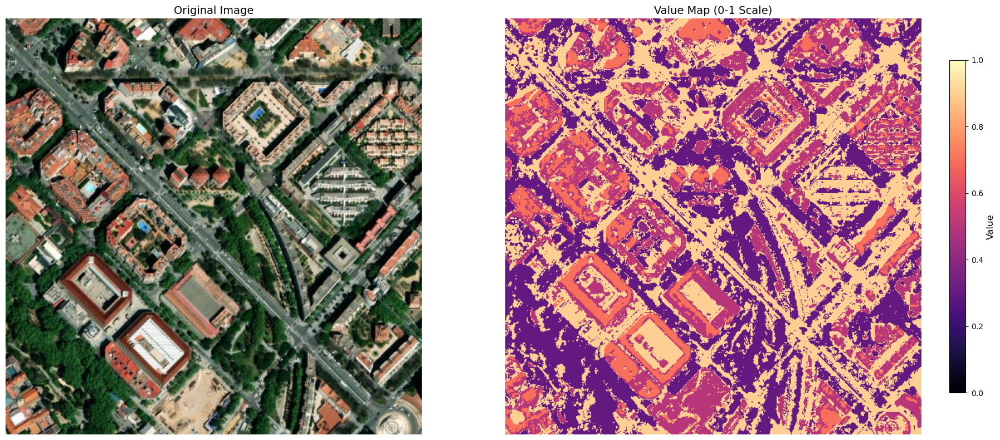

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Get the uploaded filename
image_path = "OSM_satellite_images/5.png"

# Load the image
image = cv2.imread(image_path)

# Resize the image to 500x500
image = cv2.resize(image, (500, 500))

# Convert BGR to RGB for correct display
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert BGR to HSV for color detection
image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define HSV ranges for different colors with your preferred labels
color_ranges = {
    "Trees": ([35, 50, 30], [85, 255, 200]),       # Green vegetation
    "Brick": ([0, 30, 50], [15, 255, 255]),        # Light to dark reds
    "Water": ([90, 50, 50], [130, 255, 255]),      # Blue objects, water
    "Concrete": ([100, 0, 30], [180, 70, 200]),    # Grey surfaces, concrete
    "Soil": ([10, 30, 50], [30, 150, 220])         # Light brown, soil
}

# Define assigned values for each category (0 to 1 scale)
category_values = {
    "Concrete": 0.8,
    "Asphalt": 0.9,  # Will be used for unlabeled areas
    "Trees": 0.3,
    "Soil": 0.5,
    "Water": 0.4,
    "Brick": 0.7     # Added value for brick
}

# Create masks and calculate percentages for each color
masks = {}
total_pixels = image.shape[0] * image.shape[1]

for color_name, (lower, upper) in color_ranges.items():
    # Convert bounds to numpy arrays
    lower = np.array(lower, dtype="uint8")
    upper = np.array(upper, dtype="uint8")

    # Create binary mask for the selected color
    mask = cv2.inRange(image_hsv, lower, upper)

    # Apply morphological operations to clean up the mask
    kernel = np.ones((1, 1), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    # Store the mask
    masks[color_name] = mask

# Create a combined binary mask of all detected colors
all_colors_mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
for mask in masks.values():
    all_colors_mask = cv2.bitwise_or(all_colors_mask, mask)

# Create the "Asphalt" category mask for pixels not matched by any color
asphalt_mask = cv2.bitwise_not(all_colors_mask)
masks["Asphalt"] = asphalt_mask

# Create value-based image (floating point for smooth color gradients)
value_image = np.zeros((image.shape[0], image.shape[1]), dtype=np.float32)

# Assign values to each category's pixels
for category, mask in masks.items():
    # Get the value for this category (default to 0 if not specified)
    value = category_values.get(category, 0)
    value_image[mask > 0] = value

# Create a figure with two subplots side by side with specific size control
fig = plt.figure(figsize=(20, 8))  # Total figure size (width, height) in inches

# Create a gridspec with controlled width ratios
gs = fig.add_gridspec(1, 2, width_ratios=[1, 1])  # Equal width for both subplots

# Create axes with the specific gridspec - this controls relative sizes
ax1 = fig.add_subplot(gs[0, 0])  # Original image
ax2 = fig.add_subplot(gs[0, 1])  # Value map

# Display original image
ax1.imshow(image_rgb)
ax1.set_title('Original Image', fontsize=14)
ax1.axis('off')

# Display value-based image with viridis colormap
im = ax2.imshow(value_image, cmap='magma', vmin=0, vmax=1)
ax2.set_title('Value Map (0-1 Scale)', fontsize=14)
ax2.axis('off')

# Add colorbar
cbar = fig.colorbar(im, ax=ax2, orientation='vertical', shrink=0.8, pad=0.05)
cbar.set_label('Value', fontsize=12)

# No category text labels - just a clean numerical scale

# Add text labels to the colorbar for each category
cbar_ax = cbar.ax
category_positions = {}

# Calculate positions on the colorbar for each category value
for category, value in category_values.items():
    if category in masks and np.count_nonzero(masks[category]) > 0:
        # Only include categories that actually appear in the image
        category_positions[category] = value



plt.tight_layout()



**Tiling**


> Apply segmentation across tiles



Upload your 9 satellite image tiles (3x3 grid):
['OSM_satellite_images/0.png', 'OSM_satellite_images/1.png', 'OSM_satellite_images/2.png', 'OSM_satellite_images/3.png', 'OSM_satellite_images/4.png', 'OSM_satellite_images/5.png', 'OSM_satellite_images/6.png', 'OSM_satellite_images/7.png', 'OSM_satellite_images/8.png']
Processing image 1/9: OSM_satellite_images/0.png
Processing image 2/9: OSM_satellite_images/1.png
Processing image 3/9: OSM_satellite_images/2.png
Processing image 4/9: OSM_satellite_images/3.png
Processing image 5/9: OSM_satellite_images/4.png
Processing image 6/9: OSM_satellite_images/5.png
Processing image 7/9: OSM_satellite_images/6.png
Processing image 8/9: OSM_satellite_images/7.png
Processing image 9/9: OSM_satellite_images/8.png


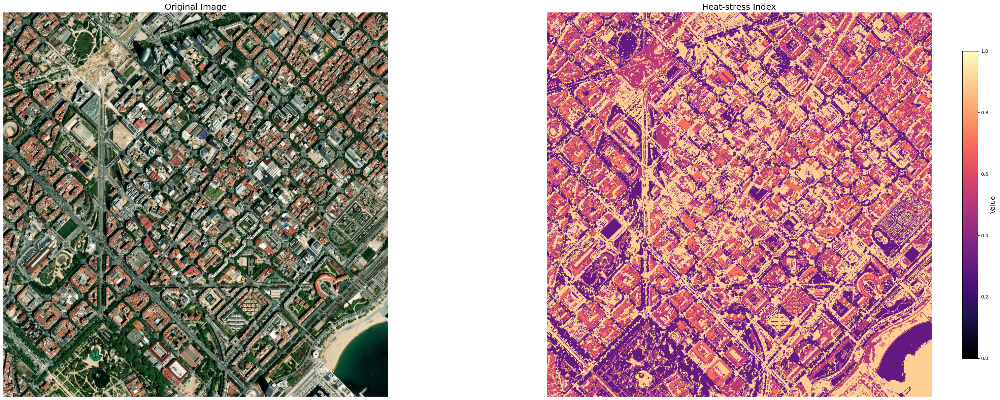

Processing complete.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import os

# Upload multiple files
print("Upload your 9 satellite image tiles (3x3 grid):")

# Define HSV ranges for different colors with your preferred labels
color_ranges = {
    "Trees": ([35, 50, 30], [85, 255, 200]),       # Green vegetation
    "Brick": ([0, 30, 50], [15, 255, 255]),        # Light to dark reds
    "Water": ([90, 50, 50], [130, 255, 255]),      # Blue objects, water
    "Concrete": ([100, 0, 30], [180, 70, 200]),    # Grey surfaces, concrete
    "Soil": ([10, 30, 50], [30, 150, 220])         # Light brown, soil
}

# Define assigned values for each category (0 to 1 scale)
category_values = {
    "Concrete": 0.8,
    "Asphalt": 0.9,  # Will be used for unlabeled areas
    "Trees": 0.3,
    "Soil": 0.5,
    "Water": 0.4,
    "Brick": 0.7     # Added value for brick
}

def process_image(image_path):
    """Process a single image and return value map"""
    # Load the image
    image = cv2.imread(image_path)

    # Resize the image to maintain consistency
    image = cv2.resize(image, (500, 500))

    # Convert BGR to RGB for correct display
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Convert BGR to HSV for color detection
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Create masks for each color
    masks = {}

    for color_name, (lower, upper) in color_ranges.items():
        # Convert bounds to numpy arrays
        lower = np.array(lower, dtype="uint8")
        upper = np.array(upper, dtype="uint8")

        # Create binary mask for the selected color
        mask = cv2.inRange(image_hsv, lower, upper)

        # Apply morphological operations to clean up the mask
        kernel = np.ones((1, 1), np.uint8)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

        # Store the mask
        masks[color_name] = mask

    # Create a combined binary mask of all detected colors
    all_colors_mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
    for mask in masks.values():
        all_colors_mask = cv2.bitwise_or(all_colors_mask, mask)

    # Create the "Asphalt" category mask for pixels not matched by any color
    asphalt_mask = cv2.bitwise_not(all_colors_mask)
    masks["Asphalt"] = asphalt_mask

    # Create value-based image (floating point for smooth color gradients)
    value_image = np.zeros((image.shape[0], image.shape[1]), dtype=np.float32)

    # Assign values to each category's pixels
    for category, mask in masks.items():
        # Get the value for this category (default to 0 if not specified)
        value = category_values.get(category, 0)
        value_image[mask > 0] = value

    return image_rgb, value_image

# Process each uploaded image
filenames2 = []
filenames = os.listdir("OSM_satellite_images")
filenames = filenames[:9]
for filename in filenames:
    filename = os.path.join("OSM_satellite_images", filename)
    filenames2.append(filename)
filenames = filenames2
total_images = len(filenames)

if total_images > 0:
    # Sort the filenames to ensure proper grid arrangement
    filenames.sort()

    # Check if we have 9 images for a 3x3 grid
    if total_images == 9:
        # Create empty arrays to hold the combined images
        img_size = 500  # Size of each processed image
        combined_original = np.zeros((img_size * 3, img_size * 3, 3), dtype=np.uint8)
        combined_value_map = np.zeros((img_size * 3, img_size * 3), dtype=np.float32)

        # Process each image and place in the grid
        for i, filename in enumerate(filenames):
            print(f"Processing image {i+1}/9: {filename}")

            # Calculate row and column - MODIFIED for top-left to bottom-right orientation
            # This changes how indices are calculated to match your requested orientation
            col = i // 3  # Column increases as we go down through each set of 3 files
            row = i % 3   # Row cycles through 0, 1, 2 for each column

            # Process this image
            img_rgb, value_img = process_image(filename)

            # Insert into the combined images
            row_start = row * img_size
            row_end = (row + 1) * img_size
            col_start = col * img_size
            col_end = (col + 1) * img_size

            combined_original[row_start:row_end, col_start:col_end] = img_rgb
            combined_value_map[row_start:row_end, col_start:col_end] = value_img

        # Create a figure to display only the combined original and value map side by side
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(35, 12))

        # Display combined original image
        ax1.imshow(combined_original)
        ax1.set_title('Original Image', fontsize=18)
        ax1.axis('off')

        # Display combined value map
        im = ax2.imshow(combined_value_map, cmap='magma', vmin=0, vmax=1)
        ax2.set_title('Heat-stress Index', fontsize=18)
        ax2.axis('off')

        # Add colorbar
        cbar = fig.colorbar(im, ax=ax2, orientation='vertical', shrink=0.8, pad=0.05)
        cbar.set_label('Value', fontsize=14)

        plt.tight_layout()
        plt.show()

        print("Processing complete.")

    else:
        print(f"Expected 9 images for a 3x3 grid, but found {total_images} images.")
        print("Please upload exactly 9 images.")
else:
    print("No files were uploaded.")

**Graphs**


Upload your 9 satellite image tiles (3x3 grid):
Processing image 1/9: OSM_satellite_images/0.png
Processing image 2/9: OSM_satellite_images/1.png
Processing image 3/9: OSM_satellite_images/2.png
Processing image 4/9: OSM_satellite_images/3.png
Processing image 5/9: OSM_satellite_images/4.png
Processing image 6/9: OSM_satellite_images/5.png
Processing image 7/9: OSM_satellite_images/6.png
Processing image 8/9: OSM_satellite_images/7.png
Processing image 9/9: OSM_satellite_images/8.png


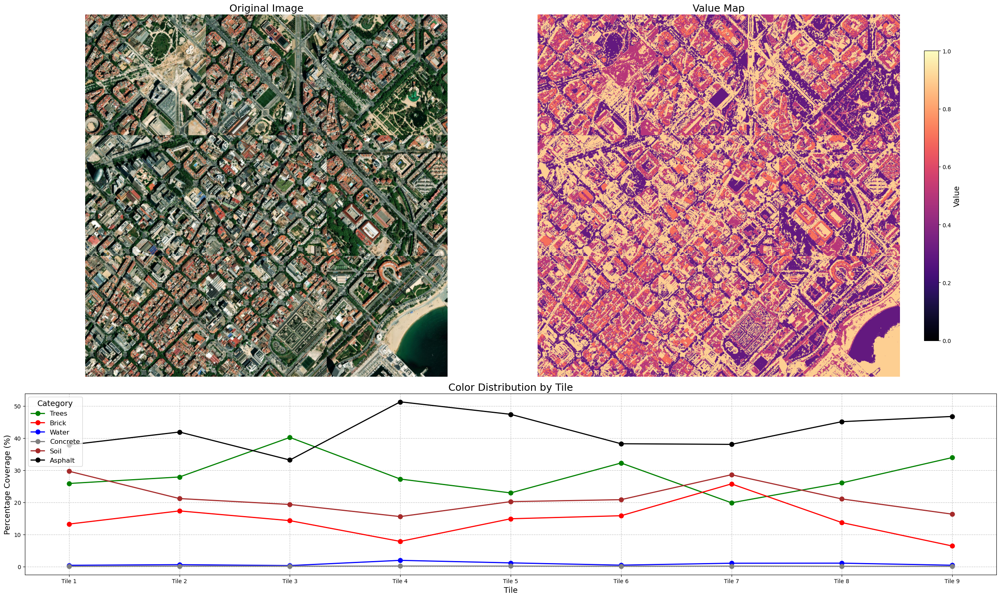

Processing complete.


In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import os
import pandas as pd
import seaborn as sns

# Upload multiple files
print("Upload your 9 satellite image tiles (3x3 grid):")

# Define HSV ranges for different colors with your preferred labels
color_ranges = {
    "Trees": ([35, 50, 30], [85, 255, 200]),       # Green vegetation
    "Brick": ([0, 30, 50], [15, 255, 255]),        # Light to dark reds
    "Water": ([90, 50, 50], [130, 255, 255]),      # Blue objects, water
    "Concrete": ([100, 0, 30], [180, 70, 200]),    # Grey surfaces, concrete
    "Soil": ([10, 30, 50], [30, 150, 220])         # Light brown, soil
}

# Define assigned values for each category (0 to 1 scale)
category_values = {
    "Concrete": 0.8,
    "Asphalt": 0.9,  # Will be used for unlabeled areas
    "Trees": 0.3,
    "Soil": 0.5,
    "Water": 0.4,
    "Brick": 0.7     # Added value for brick
}

def process_image(image_path):
    """Process a single image and return value map and mask percentages"""
    # Load the image
    image = cv2.imread(image_path)

    # Resize the image to maintain consistency
    image = cv2.resize(image, (500, 500))

    # Convert BGR to RGB for correct display
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Convert BGR to HSV for color detection
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Create masks for each color
    masks = {}
    percentages = {}
    total_pixels = image.shape[0] * image.shape[1]

    for color_name, (lower, upper) in color_ranges.items():
        # Convert bounds to numpy arrays
        lower = np.array(lower, dtype="uint8")
        upper = np.array(upper, dtype="uint8")

        # Create binary mask for the selected color
        mask = cv2.inRange(image_hsv, lower, upper)

        # Apply morphological operations to clean up the mask
        kernel = np.ones((1, 1), np.uint8)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

        # Store the mask
        masks[color_name] = mask

        # Calculate percentage
        detected_pixels = np.count_nonzero(mask)
        percentage = (detected_pixels / total_pixels) * 100
        percentages[color_name] = percentage

    # Create a combined binary mask of all detected colors
    all_colors_mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
    for mask in masks.values():
        all_colors_mask = cv2.bitwise_or(all_colors_mask, mask)

    # Create the "Asphalt" category mask for pixels not matched by any color
    asphalt_mask = cv2.bitwise_not(all_colors_mask)
    masks["Asphalt"] = asphalt_mask

    # Calculate percentage for "Asphalt" category
    asphalt_pixels = np.count_nonzero(asphalt_mask)
    asphalt_percentage = (asphalt_pixels / total_pixels) * 100
    percentages["Asphalt"] = asphalt_percentage

    # Create value-based image (floating point for smooth color gradients)
    value_image = np.zeros((image.shape[0], image.shape[1]), dtype=np.float32)

    # Assign values to each category's pixels
    for category, mask in masks.items():
        # Get the value for this category (default to 0 if not specified)
        value = category_values.get(category, 0)
        value_image[mask > 0] = value

    return image_rgb, value_image, percentages

# Process each uploaded image
filenames2 = []
filenames = os.listdir("OSM_satellite_images")
filenames = filenames[:9]
for filename in filenames:
    filename = os.path.join("OSM_satellite_images", filename)
    filenames2.append(filename)
filenames = filenames2
total_images = len(filenames)

if total_images > 0:
    # Sort the filenames to ensure proper grid arrangement
    filenames.sort()

    # Check if we have 9 images for a 3x3 grid
    if total_images == 9:
        # Create empty arrays to hold the combined images
        img_size = 500  # Size of each processed image
        combined_original = np.zeros((img_size * 3, img_size * 3, 3), dtype=np.uint8)
        combined_value_map = np.zeros((img_size * 3, img_size * 3), dtype=np.float32)

        # Store percentage data for each tile
        all_percentages = []
        tile_labels = []

        # Process each image and place in the grid
        for i, filename in enumerate(filenames):
            print(f"Processing image {i+1}/9: {filename}")

            # Calculate row and column
            row = i // 3
            col = i % 3

            # Process this image
            img_rgb, value_img, percentages = process_image(filename)

            # Store percentage data
            percentages["Tile_Index"] = i + 1  # Add tile identifier (numeric for easier sorting)
            all_percentages.append(percentages)
            tile_labels.append(f"Tile {i+1}")

            # Insert into the combined images
            row_start = row * img_size
            row_end = (row + 1) * img_size
            col_start = col * img_size
            col_end = (col + 1) * img_size

            combined_original[row_start:row_end, col_start:col_end] = img_rgb
            combined_value_map[row_start:row_end, col_start:col_end] = value_img

        # Create a figure with 2 subplots - one for images, one for the line chart
        fig = plt.figure(figsize=(25, 15))

        # Create a grid for multiple subplots
        gs = fig.add_gridspec(2, 2, height_ratios=[2, 1])

        # Original image subplot
        ax1 = fig.add_subplot(gs[0, 0])
        ax1.imshow(combined_original)
        ax1.set_title('Original Image', fontsize=18)
        ax1.axis('off')

        # Value map subplot
        ax2 = fig.add_subplot(gs[0, 1])
        im = ax2.imshow(combined_value_map, cmap='magma', vmin=0, vmax=1)
        ax2.set_title('Value Map', fontsize=18)
        ax2.axis('off')

        # Add colorbar
        cbar = fig.colorbar(im, ax=ax2, orientation='vertical', shrink=0.8, pad=0.05)
        cbar.set_label('Value', fontsize=14)

        # Create a line chart of percentages in the bottom row spanning both columns
        ax3 = fig.add_subplot(gs[1, :])

        # Convert percentages to DataFrame for plotting
        df = pd.DataFrame(all_percentages)

        # Create a line plot for each category
        categories = [c for c in color_ranges.keys()] + ["Asphalt"]

        # Define colors for each category line
        category_colors = {
            "Trees": "green",
            "Brick": "red",
            "Water": "blue",
            "Concrete": "gray",
            "Soil": "brown",
            "Asphalt": "black"
        }

        # Create the line plot
        for category in categories:
            # Sort by tile index to ensure correct order
            plot_data = pd.DataFrame({
                'Tile': [p["Tile_Index"] for p in all_percentages],
                'Percentage': [p[category] for p in all_percentages]
            }).sort_values('Tile')

            # Plot the line for this category
            ax3.plot(plot_data['Tile'], plot_data['Percentage'],
                    marker='o', linewidth=2, markersize=8,
                    label=category, color=category_colors.get(category, None))

        # Set the x-axis labels to "Tile 1", "Tile 2", etc.
        ax3.set_xticks(range(1, len(all_percentages) + 1))
        ax3.set_xticklabels([f"Tile {i}" for i in range(1, len(all_percentages) + 1)])

        # Add labels and title
        ax3.set_title('Color Distribution by Tile', fontsize=18)
        ax3.set_xlabel('Tile', fontsize=14)
        ax3.set_ylabel('Percentage Coverage (%)', fontsize=14)
        ax3.legend(title='Category', fontsize=12, title_fontsize=14)
        ax3.grid(True, linestyle='--', alpha=0.7)

        plt.tight_layout()
        plt.show()

        print("Processing complete.")

    else:
        print(f"Expected 9 images for a 3x3 grid, but found {total_images} images.")
        print("Please upload exactly 9 images.")
else:
    print("No files were uploaded.")